In [16]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mnist-in-csv/mnist_test.csv
/kaggle/input/mnist-in-csv/mnist_train.csv


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

# Hyperparameters
batch_size = 128
image_size = 64  # Assuming celebrity images are larger, setting to 64x64
nc = 3  # Number of color channels in the images (3 for RGB)
nz = 100  # Size of the latent vector
ngf = 64  # Size of feature maps in the generator
ndf = 64  # Size of feature maps in the discriminator
num_epochs = 500
lr = 0.0002
beta1 = 0.5  # Beta1 hyperparam for Adam optimizer


In [ ]:
# Transform for the dataset
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5], [0.5])
])


In [ ]:
# Loading the custom dataset from Kaggle
# Update the root directory path as per your dataset
dataset = dsets.ImageFolder(root='/kaggle/input/celebrity-face-image-dataset', transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Weight initialization function
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
# Generator class
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Discriminator class
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
# Create the generator and discriminator
netG = Generator().to(device)
netG.apply(weights_init)

netD = Discriminator().to(device)
netD.apply(weights_init)

# Loss function and optimizers
criterion = nn.BCELoss()
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))


Using device: cuda
[0/500][0/15] Loss_D: 1.4819 Loss_G: 6.7475 D(x): 0.5968 D(G(z)): 0.5057 / 0.0020
[1/500][0/15] Loss_D: 0.5661 Loss_G: 16.0062 D(x): 0.7407 D(G(z)): 0.0001 / 0.0000
[2/500][0/15] Loss_D: 0.2881 Loss_G: 11.3923 D(x): 0.8695 D(G(z)): 0.0001 / 0.0000
[3/500][0/15] Loss_D: 0.2598 Loss_G: 26.6744 D(x): 0.8714 D(G(z)): 0.0000 / 0.0000
[4/500][0/15] Loss_D: 0.4588 Loss_G: 13.0111 D(x): 0.9345 D(G(z)): 0.2763 / 0.0000
[5/500][0/15] Loss_D: 0.6434 Loss_G: 22.1779 D(x): 0.7611 D(G(z)): 0.0000 / 0.0000
[6/500][0/15] Loss_D: 0.0023 Loss_G: 12.7061 D(x): 0.9977 D(G(z)): 0.0000 / 0.0000
[7/500][0/15] Loss_D: 0.2639 Loss_G: 16.2938 D(x): 0.9151 D(G(z)): 0.0005 / 0.0000
[8/500][0/15] Loss_D: 1.7179 Loss_G: 12.1761 D(x): 0.9587 D(G(z)): 0.7017 / 0.0002
[9/500][0/15] Loss_D: 0.6963 Loss_G: 2.5962 D(x): 0.6767 D(G(z)): 0.0801 / 0.1240
[10/500][0/15] Loss_D: 0.7980 Loss_G: 2.8914 D(x): 0.5649 D(G(z)): 0.0075 / 0.0807
[11/500][0/15] Loss_D: 3.3733 Loss_G: 4.5699 D(x): 0.1142 D(G(z)): 0.0

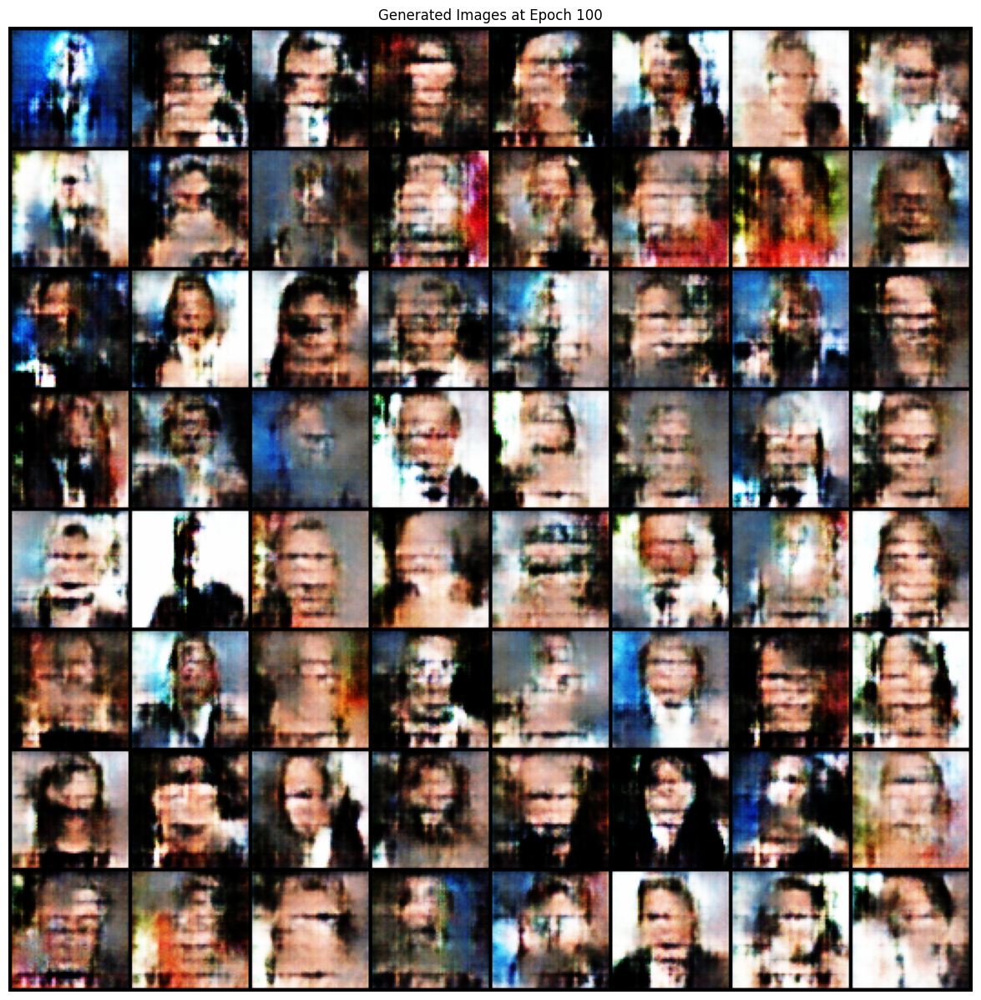

[100/500][0/15] Loss_D: 0.2689 Loss_G: 4.2290 D(x): 0.8846 D(G(z)): 0.1072 / 0.0296
[101/500][0/15] Loss_D: 2.2466 Loss_G: 9.3082 D(x): 0.9951 D(G(z)): 0.7954 / 0.0004
[102/500][0/15] Loss_D: 0.2871 Loss_G: 3.8252 D(x): 0.8595 D(G(z)): 0.0947 / 0.0488
[103/500][0/15] Loss_D: 0.7633 Loss_G: 7.4230 D(x): 0.9641 D(G(z)): 0.4242 / 0.0016
[104/500][0/15] Loss_D: 1.2530 Loss_G: 8.8629 D(x): 0.9889 D(G(z)): 0.5952 / 0.0004
[105/500][0/15] Loss_D: 0.4526 Loss_G: 2.9813 D(x): 0.7573 D(G(z)): 0.0945 / 0.1286
[106/500][0/15] Loss_D: 0.2058 Loss_G: 3.9986 D(x): 0.8997 D(G(z)): 0.0815 / 0.0397
[107/500][0/15] Loss_D: 0.8318 Loss_G: 7.3118 D(x): 0.9740 D(G(z)): 0.4502 / 0.0020
[108/500][0/15] Loss_D: 0.5197 Loss_G: 2.8783 D(x): 0.7470 D(G(z)): 0.1281 / 0.1192
[109/500][0/15] Loss_D: 0.5977 Loss_G: 6.5648 D(x): 0.9474 D(G(z)): 0.3142 / 0.0051
[110/500][0/15] Loss_D: 3.5372 Loss_G: 9.0262 D(x): 0.9646 D(G(z)): 0.8115 / 0.0126
[111/500][0/15] Loss_D: 0.4956 Loss_G: 3.5876 D(x): 0.8609 D(G(z)): 0.1981 /

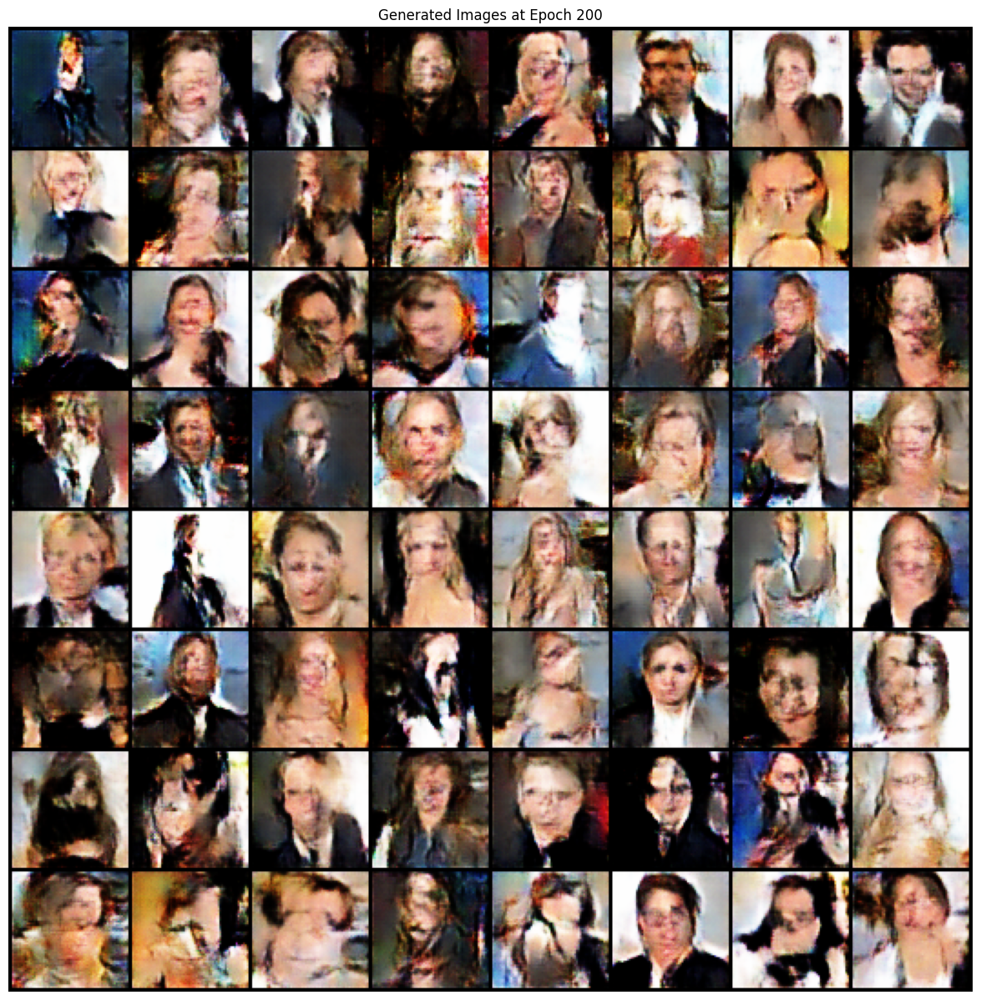

[200/500][0/15] Loss_D: 0.1329 Loss_G: 3.7033 D(x): 0.9065 D(G(z)): 0.0284 / 0.0406
[201/500][0/15] Loss_D: 0.4806 Loss_G: 6.9509 D(x): 0.9915 D(G(z)): 0.3034 / 0.0025
[202/500][0/15] Loss_D: 1.0651 Loss_G: 7.9379 D(x): 0.8875 D(G(z)): 0.4067 / 0.0023
[203/500][0/15] Loss_D: 0.4924 Loss_G: 4.2109 D(x): 0.7573 D(G(z)): 0.0988 / 0.0456
[204/500][0/15] Loss_D: 0.5449 Loss_G: 6.3084 D(x): 0.9637 D(G(z)): 0.3065 / 0.0050
[205/500][0/15] Loss_D: 0.9196 Loss_G: 7.3197 D(x): 0.9837 D(G(z)): 0.4803 / 0.0017
[206/500][0/15] Loss_D: 0.4317 Loss_G: 6.2195 D(x): 0.9685 D(G(z)): 0.2804 / 0.0045
[207/500][0/15] Loss_D: 0.1222 Loss_G: 4.4306 D(x): 0.9583 D(G(z)): 0.0704 / 0.0233
[208/500][0/15] Loss_D: 0.7188 Loss_G: 7.6864 D(x): 0.9920 D(G(z)): 0.4135 / 0.0012
[209/500][0/15] Loss_D: 0.1239 Loss_G: 4.0905 D(x): 0.9466 D(G(z)): 0.0614 / 0.0313
[210/500][0/15] Loss_D: 0.1167 Loss_G: 3.9247 D(x): 0.9468 D(G(z)): 0.0550 / 0.0329
[211/500][0/15] Loss_D: 0.1612 Loss_G: 4.0120 D(x): 0.9646 D(G(z)): 0.1045 /

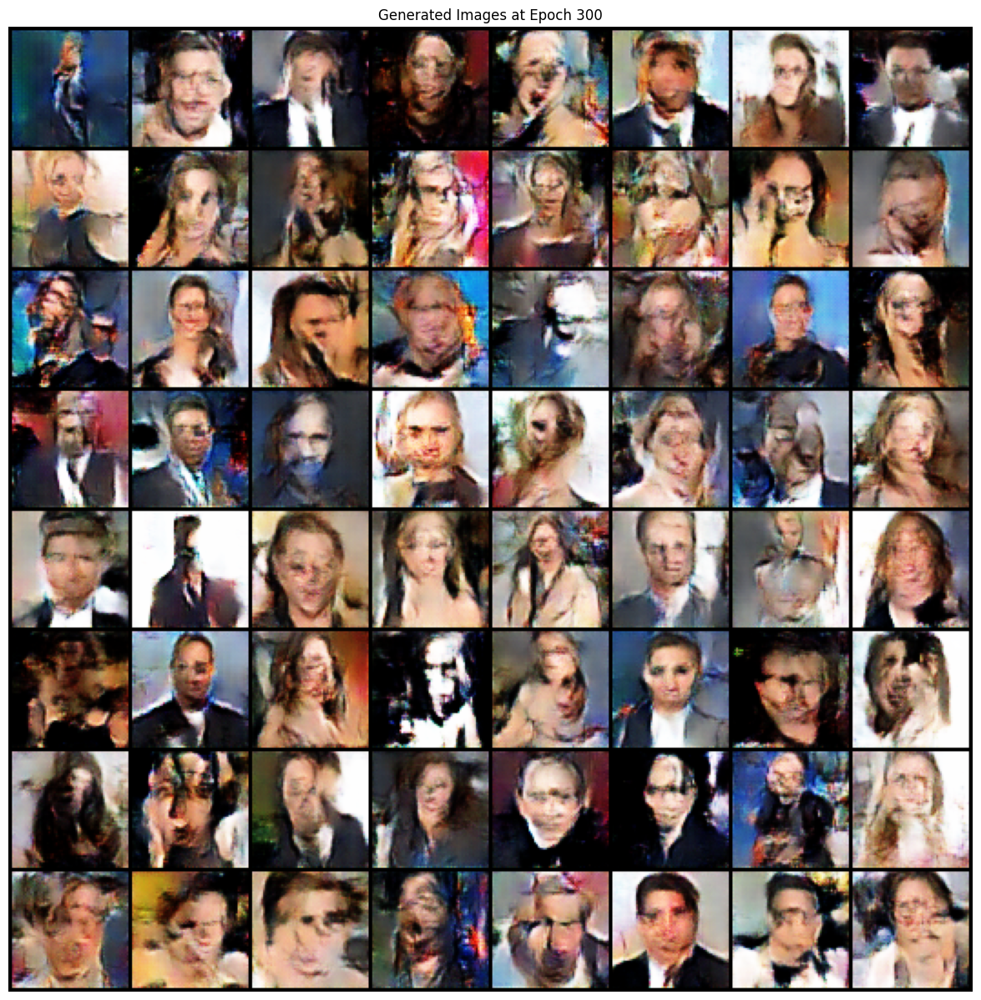

[300/500][0/15] Loss_D: 0.0649 Loss_G: 4.6060 D(x): 0.9842 D(G(z)): 0.0446 / 0.0187
[301/500][0/15] Loss_D: 0.0522 Loss_G: 4.6948 D(x): 0.9675 D(G(z)): 0.0184 / 0.0168
[302/500][0/15] Loss_D: 0.1467 Loss_G: 4.1845 D(x): 0.8998 D(G(z)): 0.0188 / 0.0484
[303/500][0/15] Loss_D: 0.0819 Loss_G: 4.2224 D(x): 0.9395 D(G(z)): 0.0170 / 0.0337
[304/500][0/15] Loss_D: 0.0736 Loss_G: 4.6772 D(x): 0.9896 D(G(z)): 0.0589 / 0.0154
[305/500][0/15] Loss_D: 0.0444 Loss_G: 4.5824 D(x): 0.9830 D(G(z)): 0.0262 / 0.0181
[306/500][0/15] Loss_D: 0.0995 Loss_G: 5.2455 D(x): 0.9937 D(G(z)): 0.0799 / 0.0092
[307/500][0/15] Loss_D: 0.1710 Loss_G: 6.7841 D(x): 0.9948 D(G(z)): 0.1402 / 0.0024
[308/500][0/15] Loss_D: 0.0599 Loss_G: 4.5971 D(x): 0.9628 D(G(z)): 0.0193 / 0.0218
[309/500][0/15] Loss_D: 0.0453 Loss_G: 4.9114 D(x): 0.9881 D(G(z)): 0.0315 / 0.0135
[310/500][0/15] Loss_D: 0.0365 Loss_G: 4.7160 D(x): 0.9856 D(G(z)): 0.0214 / 0.0155
[311/500][0/15] Loss_D: 0.0719 Loss_G: 5.4201 D(x): 0.9946 D(G(z)): 0.0601 /

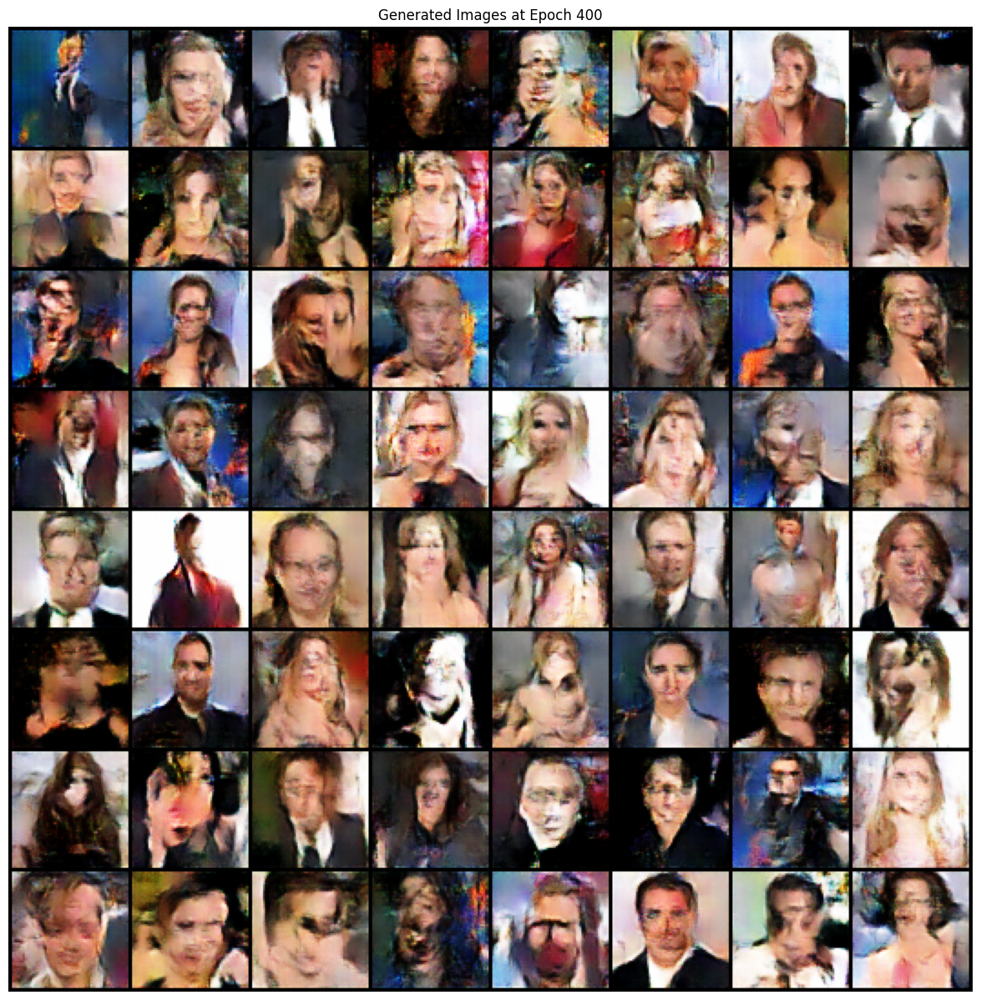

[400/500][0/15] Loss_D: 0.0410 Loss_G: 5.7580 D(x): 0.9713 D(G(z)): 0.0089 / 0.0105
[401/500][0/15] Loss_D: 0.0370 Loss_G: 4.9684 D(x): 0.9885 D(G(z)): 0.0246 / 0.0119
[402/500][0/15] Loss_D: 0.0897 Loss_G: 5.6170 D(x): 0.9931 D(G(z)): 0.0703 / 0.0064
[403/500][0/15] Loss_D: 0.0752 Loss_G: 6.0105 D(x): 0.9944 D(G(z)): 0.0640 / 0.0040
[404/500][0/15] Loss_D: 0.1232 Loss_G: 6.3546 D(x): 0.9945 D(G(z)): 0.0984 / 0.0031
[405/500][0/15] Loss_D: 0.0587 Loss_G: 4.9678 D(x): 0.9904 D(G(z)): 0.0404 / 0.0127
[406/500][0/15] Loss_D: 0.0334 Loss_G: 4.9291 D(x): 0.9929 D(G(z)): 0.0246 / 0.0133
[407/500][0/15] Loss_D: 0.3040 Loss_G: 9.2749 D(x): 0.9980 D(G(z)): 0.1915 / 0.0002
[408/500][0/15] Loss_D: 1.9581 Loss_G: 2.6316 D(x): 0.7836 D(G(z)): 0.6195 / 0.1906
[409/500][0/15] Loss_D: 1.2768 Loss_G: 4.7726 D(x): 0.8197 D(G(z)): 0.4776 / 0.0435
[410/500][0/15] Loss_D: 1.0445 Loss_G: 8.7608 D(x): 0.9546 D(G(z)): 0.4153 / 0.0019
[411/500][0/15] Loss_D: 0.7239 Loss_G: 8.4515 D(x): 0.9628 D(G(z)): 0.3710 /

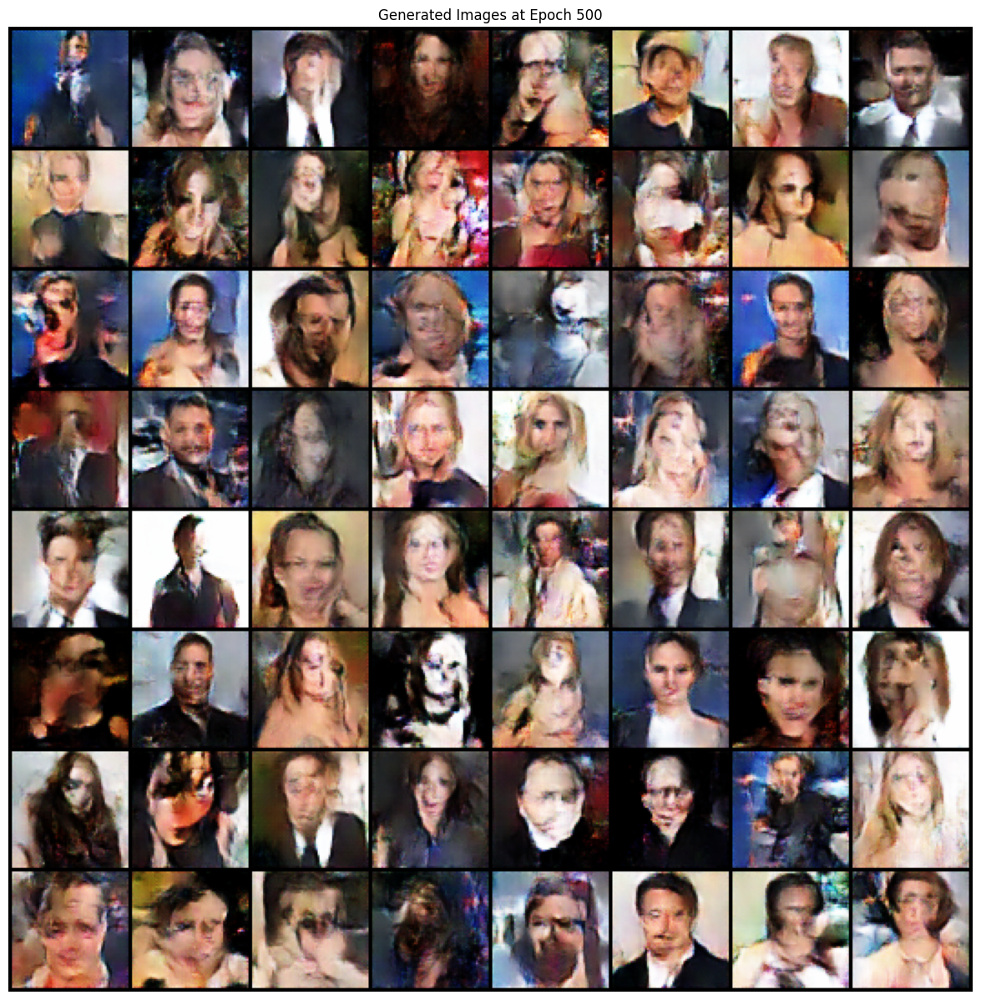

Training Finished!


In [1]:
# Training Loop
img_list = []
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        # Update Discriminator with real images
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # Update Discriminator with fake images
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        # Update Generator
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Print and save results
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
                  f'Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} '
                  f'D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}')
            
            vutils.save_image(real_cpu, f'/kaggle/working/real_samples.png', normalize=True)
            fake = netG(fixed_noise)
            vutils.save_image(fake.detach(), f'/kaggle/working/fake_samples_epoch_{epoch:03d}.png', normalize=True)
            
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    # Plot images every 100 epochs
    if (epoch + 1) % 100 == 0:
        plt.figure(figsize=(15, 15))
        plt.axis("off")
        plt.title(f"Generated Images at Epoch {epoch + 1}")
        plt.imshow(np.transpose(img_list[-1].cpu(), (1, 2, 0)))
        plt.show()

print("Training Finished!")
